In [1]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.mask import mask
import pandas as pd
import numpy as np
import json
import os
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib.colors
from scipy.signal import medfilt2d

os.chdir("c:\\Users\\victo\\Box\\ACE 592 SAE\\Deforestation\\Data")

Load Amazon shapefile

In [2]:
amazon = gpd.read_file('.\\Shapefiles\\amazonia_legal.shp')

Tuberculosis cases data frame


In [3]:
tb = pd.read_csv('.\\Health\\tb_cases_monthly.csv', encoding = 'latin1')
tb.head(5)

,year,month,district_code,district_name,tb_cases
0,2001,1,110002,Ariquemes,2
1,2001,1,110003,Cabixi,1
2,2001,1,110004,Cacoal,6
3,2001,1,110006,Colorado do Oeste,2
4,2001,1,110008,Costa Marques,1


Make a yeraly aggregate by district

In [4]:
tb_year = tb.groupby(['year', 'district_code', 'district_name']).agg('sum').reset_index()
tb_year.head(5)

,year,district_code,district_name,month,tb_cases
0,2001,110001,Alta Floresta D'Oeste,33,5
1,2001,110002,Ariquemes,78,83
2,2001,110003,Cabixi,16,3
3,2001,110004,Cacoal,78,54
4,2001,110005,Cerejeiras,15,2


Load district-level shapefile

In [5]:
mn_shp = gpd.read_file('.\\Shapefiles\\Municipalties\\BR_Localidades_2010.shp')

Check equality of CRS

In [6]:
mn_shp.crs == amazon.crs

True

Since data is recorded in cities ("Cidades"), we filter out all other districts. 

In [7]:
mn_cit = mn_shp[mn_shp['NM_CATEGOR'] == 'CIDADE']

Slice the ID variable to match district IDs in the helth data frame.

In [8]:
mn_cit['district_code'] = mn_cit['CD_GEOCODD'].str.slice(stop = 6)
mn_cit['district_code'].head(5)

C:\Users\victo\anaconda3\envs\ace592\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


0     110001
6     110002
7     110003
9     110004
18    110005
Name: district_code, dtype: object

In [9]:
tb_year['district_code'] = tb_year['district_code'].astype(str)
tb_year = tb_year.drop('month', axis = 1)

Perform a spatial join of both amazon and cities shapefiles, then merge resulting shapefile woth TB cases dataframe to make maps.

In [10]:
am_shp = gpd.sjoin(amazon, mn_cit, how = 'inner', op = 'intersects')
am_shp = pd.merge(am_shp, tb_year, how = 'left', on = "district_code")

In [11]:
am_shp = am_shp[['GID_1', 'NAME_1', 'GID_2', 'NAME_2', 'GID_3', 'NAME_3', 'LONG', 'LAT', 'year', 'tb_cases', 'geometry']]
am_shp['year'] = am_shp['year'].fillna(0).astype(int)
am_shp['tb_cases'] = am_shp['tb_cases'].fillna(0).astype(int)

Aggregate cases across states and years.

In [12]:
am_shp_year = am_shp.dissolve(by=['GID_1', 'year'], aggfunc = 'sum', as_index=False).reset_index(drop=True)

Maps for selected years

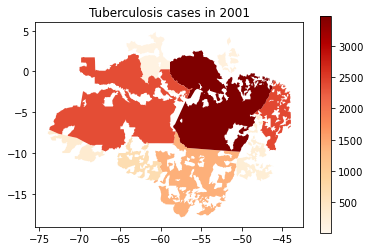

In [80]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Tuberculosis cases in 2001")
am_shp_year[am_shp_year['year'] == 2001].plot(column='tb_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/tb_2001.png")

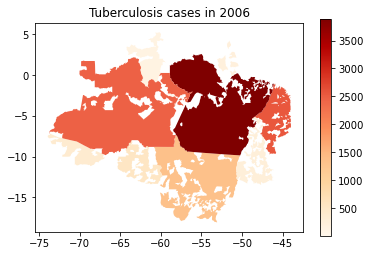

In [81]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Tuberculosis cases in 2006")
am_shp_year[am_shp_year['year'] == 2006].plot(column='tb_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/tb_2006.png")

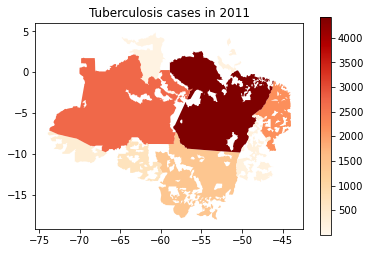

In [82]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Tuberculosis cases in 2011")
am_shp_year[am_shp_year['year'] == 2011].plot(column='tb_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/tb_2011.png")

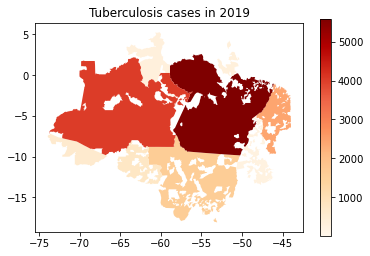

In [83]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Tuberculosis cases in 2019")
am_shp_year[am_shp_year['year'] == 2019].plot(column='tb_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/tb_2019.png")

## Chagas disease data frame

In [17]:
cd = pd.read_csv('.\\Health\\cd_cases_monthly.csv', encoding = 'utf-8')

In [18]:
cd_year = cd.groupby(['year', 'district_code', 'district_name']).agg('sum').reset_index()
cd_year = cd_year.drop(columns = 'month')

In [19]:
cd_year['district_code'] = cd_year['district_code'].astype(str)

In [20]:
am_shp_cd = gpd.sjoin(amazon, mn_cit, how = 'inner', op = 'intersects')
am_shp_cd = pd.merge(am_shp_cd, cd_year, how = 'right', on = "district_code")

In [21]:
am_shp_cd = am_shp_cd[['GID_1', 'NAME_1', 'GID_2', 'NAME_2', 'GID_3', 'NAME_3', 'LONG', 'LAT', 'year', 'cd_cases', 'geometry']]
am_shp_cd['year'] = am_shp_cd['year'].fillna(0).astype(int)
am_shp_cd['cd_cases'] = am_shp_cd['cd_cases'].fillna(0).astype(int)

In [22]:
am_shp_cd_year = am_shp_cd.dissolve(by=['GID_1', 'year'], aggfunc = 'sum', as_index=False).reset_index(drop=True)

Yearly plots

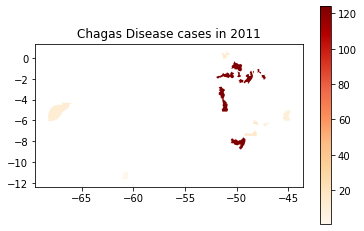

In [84]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Chagas Disease cases in 2011")
am_shp_cd_year[am_shp_cd_year['year'] == 2011].plot(column='cd_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/cd_2011.png")

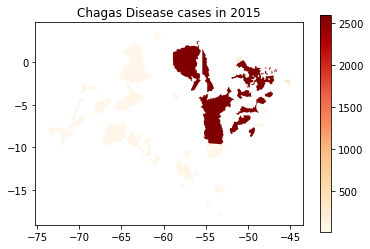

In [85]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Chagas Disease cases in 2015")
am_shp_cd_year[am_shp_cd_year['year'] == 2015].plot(column='cd_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/cd_2015.png")

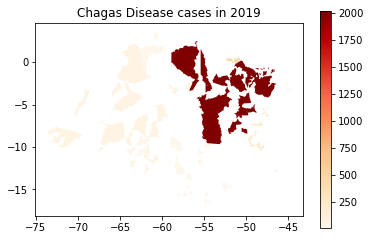

In [86]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Chagas Disease cases in 2019")
am_shp_cd_year[am_shp_cd_year['year'] == 2019].plot(column='cd_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/cd_2019.png")

## Malaria data frame

In [26]:
ml = pd.read_csv('.\\Health\\ml_cases_monthly.csv', encoding = 'utf-8')

In [27]:
ml_year = ml.groupby(['year', 'district_code', 'district_name']).agg('sum').reset_index()
ml_year = ml_year.drop(columns = 'month')
ml_year['district_code'] = ml_year['district_code'].fillna(0).astype(str)

In [28]:
am_shp_ml = gpd.sjoin(amazon, mn_cit, how = 'inner', op = 'intersects')
am_shp_ml = pd.merge(am_shp_ml, ml_year, how = 'right', on = "district_code")

In [29]:
am_shp_ml = am_shp_ml[['GID_1', 'NAME_1', 'GID_2', 'NAME_2', 'GID_3', 'NAME_3', 'LONG', 'LAT', 'year', 'ml_cases', 'geometry']]
am_shp_ml['year'] = am_shp_ml['year'].astype(int)
am_shp_ml['ml_cases'] = pd.to_numeric(am_shp_ml['ml_cases'], errors = 'coerce')

In [30]:
am_shp_ml_year = am_shp_ml.dissolve(by=['GID_1', 'year'], aggfunc = 'sum', as_index=False).reset_index(drop=True)

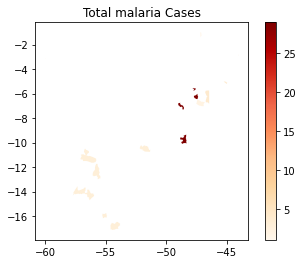

In [87]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Total malaria Cases")
am_shp_ml_year.plot(column='ml_cases', ax=ax, legend=True, cmap='OrRd')
plt.savefig("./Health/Plots/ml.png")

# Time series plots

## Tuberculosis

In [32]:
tb_ts = tb.groupby(['month','year']).agg('sum').reset_index()
tb_ts = tb_ts.drop(columns = 'district_code')
tb_ts = tb_ts.sort_values(['year', 'month']).reset_index(drop = True)
tb_ts['date'] = pd.to_datetime(tb_ts['year'].astype(str)+'-'+tb_ts['month'].astype(str)+'-01')
tb_ts = tb_ts.drop(columns = ['month','year'])

In [33]:
tb_ts = tb_ts.set_index('date')

<AxesSubplot:xlabel='date'>

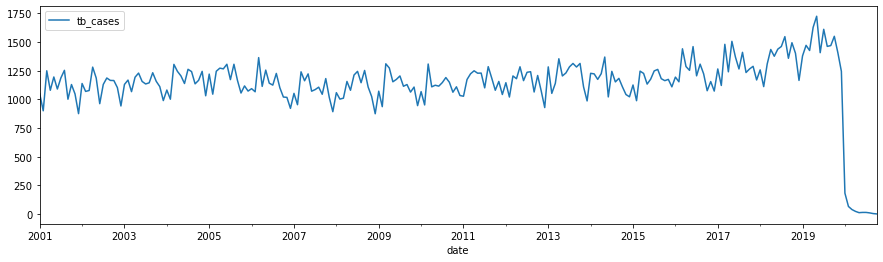

In [34]:
tb_ts.plot(figsize=(15,4))

## Malaria

In [35]:
ml_ts = ml.groupby(['month','year']).agg('sum').reset_index()
ml_ts = ml_ts.drop(columns = 'district_code')
ml_ts = ml_ts.sort_values(['year', 'month']).reset_index(drop = True)
ml_ts['date'] = pd.to_datetime(ml_ts['year'].astype(str)+'-'+ml_ts['month'].astype(str)+'-01')
ml_ts = ml_ts.drop(columns = ['month','year'])

<AxesSubplot:xlabel='date'>

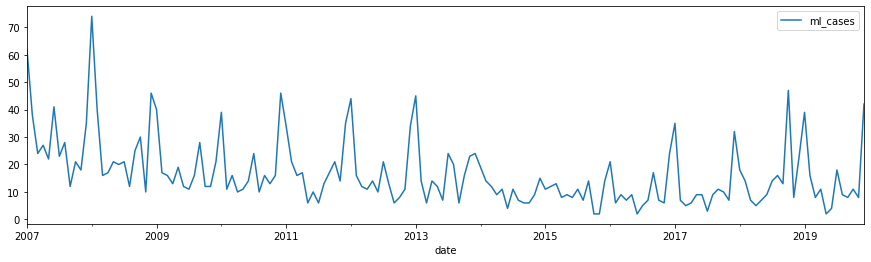

In [36]:
ml_ts = ml_ts.set_index('date')
ml_ts.plot(figsize=(15,4))

## Chagas Disease

In [37]:
cd_ts = cd.groupby(['month','year']).agg('sum').reset_index()
cd_ts = cd_ts.drop(columns = 'district_code')
cd_ts = cd_ts.sort_values(['year', 'month']).reset_index(drop = True)
cd_ts['year'] = cd_ts['year'].astype(int)
cd_ts['month'] = cd_ts['month'].astype(int)
cd_ts['date'] = pd.to_datetime(cd_ts['year'].astype(str)+'-'+cd_ts['month'].astype(str)+'-01')
cd_ts = cd_ts.drop(columns = ['month','year'])

<AxesSubplot:xlabel='date'>

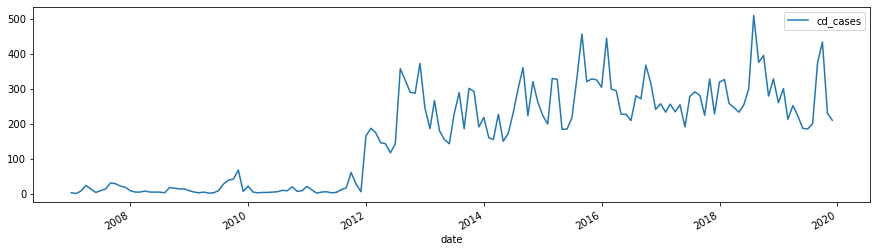

In [38]:
cd_ts = cd_ts.set_index('date')
cd_ts.plot(figsize=(15,4))

# Deforestation data by state

In [39]:
amazon_state= amazon.dissolve(by="NAME_1",aggfunc="sum")
amazon_state = amazon_state.reset_index('NAME_1')
amazon_state.rename(columns = {'NAME_1':'STATE'}, inplace = True)
amazon_state.replace('Amazonas','AM',inplace = True )
amazon_state.replace('Amapá','AP',inplace = True )
amazon_state.replace('Maranhão','MA',inplace = True )
amazon_state.replace('Mato Grosso','MT',inplace = True )
amazon_state.replace('Pará','PA',inplace = True )
amazon_state.replace('Rondônia','RO',inplace = True )
amazon_state.replace('Roraima','RR',inplace = True )
amazon_state.replace('Tocantins','TO',inplace = True )
amazon_state.replace('Acre','AC',inplace = True )
amazon_state.replace('Amazonas','AM',inplace = True )
amazon_state.replace('Amapá','AP',inplace = True )
amazon_state.replace('Maranhão','MA',inplace = True )
amazon_state.replace('Mato Grosso','MT',inplace = True )
amazon_state.replace('Pará','PA',inplace = True )
amazon_state.replace('Rondônia','RO',inplace = True )
amazon_state.replace('Roraima','RR',inplace = True )
amazon_state.replace('Tocantins','TO',inplace = True )
choose = [len(x) == 2 for x in amazon_state['STATE']]
amazon_state = amazon_state[choose]

In [40]:
Def_all = gpd.read_file("./deforestation/yearly_deforestation.shp")

Projection check

In [41]:
amazon_state.crs == Def_all.crs

False

In [42]:
Def_all = Def_all.to_crs(amazon_state.crs)
amazon_state.crs == Def_all.crs

True

## Summary Statistics
### Total loss over the years 2018-2019 for each state

In [43]:
Def_State_total = Def_all.groupby('STATE').sum().AREA_KM

Generate many dataframes of different years: def_2008 - def_2019 

In [44]:
for i in Def_all.YEAR.unique():   
    i_str = str(i)[:4]
    exec('''def_%s = Def_all[Def_all['YEAR'] == i].groupby('STATE').sum().reset_index('STATE')'''%(i_str))
    exec('''def_%s = def_%s.rename(columns = {'AREA_KM': 'AREA_KM_%s'})'''%(i_str,i_str,i_str))
    exec('''def_%s = def_%s[['STATE','AREA_KM_%s']]'''%(i_str,i_str,i_str))

In [45]:
i = 2008
for j in range(2009,2020):
    exec('''def_%s = def_%s.merge(def_%s, how = 'left')'''%(i,i,j))

([<matplotlib.axis.XTick at 0x2bb2e21af40>,
 [Text(1, 0, '$2008$'),
  Text(2, 0, '$2009$'),
  Text(3, 0, '$2010$'),
  Text(4, 0, '$2011$'),
  Text(5, 0, '$2012$'),
  Text(6, 0, '$2013$'),
  Text(7, 0, '$2014$'),
  Text(8, 0, '$2015$'),
  Text(9, 0, '$2016$'),
  Text(10, 0, '$2017$'),
  Text(11, 0, '$2018$'),
  Text(12, 0, '$2019$')])

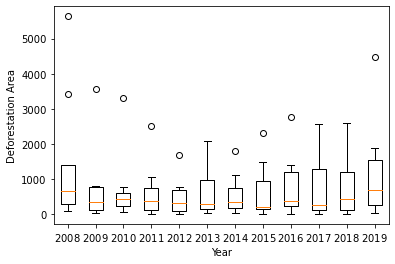

In [46]:
plt.boxplot([def_2008.AREA_KM_2008,def_2009.AREA_KM_2009,def_2010.AREA_KM_2010, \
             def_2011.AREA_KM_2011,def_2012.AREA_KM_2012,def_2013.AREA_KM_2013,def_2014.AREA_KM_2014, \
             def_2015.AREA_KM_2015,def_2016.AREA_KM_2016,def_2017.AREA_KM_2017,def_2018.AREA_KM_2018,def_2019.AREA_KM_2019])
# plt.xlabel(np.arange(2008,2020))
plt.xlabel('Year')
plt.ylabel('Deforestation Area')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,12],[r'$2008$', r'$2009$', r'$2010$', r'$2011$', r'$2012$', \
                                                r'$2013$', r'$2014$', r'$2015$', r'$2016$', r'$2017$', r'$2018$', r'$2019$'])

In [47]:
Deforestation_state_year = def_2008
Deforestation_state_year = Deforestation_state_year.set_index('STATE')
Deforestation_state_year_T = pd.DataFrame(Deforestation_state_year.values.T,columns=Deforestation_state_year.index)
year = list(range(2008,2020))
Deforestation_state_year_T['YEAR'] = year
Deforestation_state_year_T

STATE,AC,AM,AP,MA,MT,PA,RO,RR,TO,YEAR
0,289.261081,612.542161,99.915680,1399.336887,3424.094911,5637.855909,1086.191193,665.319753,104.363636,2008
1,161.738945,345.055446,48.166832,785.527712,818.780360,3558.438490,425.862263,111.324742,58.131016,2009
2,265.366857,546.380191,72.366288,602.039468,774.098257,3317.746709,431.208756,235.144470,53.751618,2010
3,296.060551,508.115882,16.766478,376.859779,1060.644308,2510.252906,763.216458,129.621620,34.048095,2011
4,270.597274,471.166128,19.527491,334.859040,789.004462,1698.803212,691.715921,107.472001,47.639245,2012
5,200.240072,480.973612,24.783779,297.388973,1106.543936,2100.863231,963.886683,148.414122,77.116069,2013
6,348.609567,552.824331,29.105426,286.365484,1106.209938,1796.889966,761.302007,189.058900,45.064027,2014
7,223.003740,687.359243,19.109310,217.418063,1495.523365,2305.093718,960.721645,154.293646,55.301121,2015
8,366.333777,1003.848712,12.413974,247.238142,1398.647059,2764.324442,1194.255704,228.528736,53.461802,2016
9,245.887601,1009.959788,17.268302,272.984846,1453.267814,2572.925302,1277.962987,121.881576,28.156130,2017


## Maps and Figures

## Figure 1. Total Defrestation of the Legal Amazon in Each Brazilian State 2008 - 2019

(0.0, 40000.0)

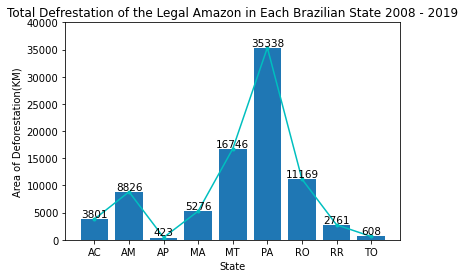

In [48]:
plt.bar(Def_all.groupby('STATE').sum().index,Def_all.groupby('STATE').sum().AREA_KM)
plt.plot(Def_all.groupby('STATE').sum().index,Def_all.groupby('STATE').sum().AREA_KM, 'c.-')
plt.xlabel('State')
plt.ylabel('Area of Deforestation(KM)')
for x, y in zip(Def_all.groupby('STATE').sum().index, Def_all.groupby('STATE').sum().AREA_KM):
    plt.text(x, y+0.3, '%.0f'%y, ha='center', va='bottom', fontsize=10.5)
plt.title('Total Defrestation of the Legal Amazon in Each Brazilian State 2008 - 2019')
ax=plt.gca()
plt.ylim(0,40000)
#plt.savefig("Figure 1 Total Defrestation of the Legal Amazon in Each Brazilian State 2008 - 2019.png")

## Figure 2. Deforestation of Legal Amazon Area across Brazalian states over years 2008-2019

Text(0, 0.5, 'Area of Deforestation(KM)')

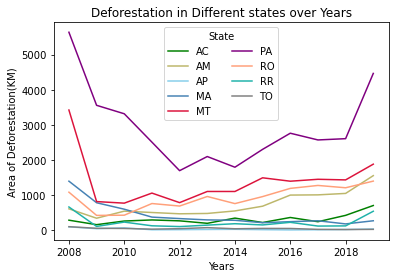

In [49]:
ac = Deforestation_state_year_T['AC']
am = Deforestation_state_year_T['AM']
ap = Deforestation_state_year_T['AP']
ma = Deforestation_state_year_T['MA']
mt = Deforestation_state_year_T['MT']
pa = Deforestation_state_year_T['PA']
ro = Deforestation_state_year_T['RO']
rr = Deforestation_state_year_T['RR']
to = Deforestation_state_year_T['TO']
year = Deforestation_state_year_T['YEAR']
plt.title('Deforestation in Different states over Years')
plt.plot(year, ac, color='green', label='AC')
plt.plot(year, am, color='DarkKhaki', label='AM')
plt.plot(year, ap,  color='skyblue', label='AP')
plt.plot(year, ma, color='SteelBlue', label='MA')
plt.plot(year, mt, color='Crimson', label='MT')
plt.plot(year, pa, color='purple', label='PA')
plt.plot(year, ro,  color='LightSalmon', label='RO')
plt.plot(year, rr, color='LightSeaGreen', label='RR')
plt.plot(year, to, color='gray', label='TO')
plt.legend(title = 'State', ncol = 2) 
plt.xlabel('Years')
plt.ylabel('Area of Deforestation(KM)')
#plt.savefig("Figure2 Deforestation of Legal Amazon Area across Brazalian states over years 2008-2019.png")

# Correlations
## Tuberculosis cases and deforestation

In [50]:
am_shp_year['STATE'] = 'PA'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.12_1'] = 'MT'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.10_1'] = 'MA'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.27_1'] = 'TO'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.4_1'] = 'AM'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.22_1'] = 'RO'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.3_1'] = 'AP'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.1_1'] = 'AC'
am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.23_1'] = 'RR'

<ipython-input-50-3f949b90e518>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.12_1'] = 'MT'
<ipython-input-50-3f949b90e518>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.10_1'] = 'MA'
<ipython-input-50-3f949b90e518>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_year['STATE'][am_shp_year['GID_1'] == 'BRA.27_1'] = 'TO'
<ipy

In [61]:
Deforestation_state_year = Deforestation_state_year.reset_index()

In [69]:
def_st = pd.wide_to_long(Deforestation_state_year, stubnames = 'AREA_KM_', i='STATE', j = 'year')
def_st = def_st.reset_index()
def_st.columns =['STATE', 'year', 'area_deforested']

In [70]:
df_tb = pd.merge(am_shp_year, def_st, how = 'inner', on = ['STATE', 'year'])

In [72]:
df_tb[['tb_cases', 'area_deforested']].corr(method = 'pearson')

,tb_cases,area_deforested
tb_cases,1.000000,0.393435
area_deforested,0.393435,1.000000


## Chagas Disease

In [73]:
am_shp_cd_year['STATE'] = 'PA'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.12_1'] = 'MT'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.10_1'] = 'MA'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.27_1'] = 'TO'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.4_1'] = 'AM'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.22_1'] = 'RO'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.3_1'] = 'AP'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.1_1'] = 'AC'
am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.23_1'] = 'RR'

<ipython-input-73-cfbc18d1179a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.12_1'] = 'MT'
<ipython-input-73-cfbc18d1179a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.10_1'] = 'MA'
<ipython-input-73-cfbc18d1179a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_cd_year['STATE'][am_shp_cd_year['GID_1'] == 'BRA.

In [74]:
df_cd = pd.merge(am_shp_cd_year, def_st, how = 'inner', on = ['STATE', 'year'])
df_cd[['cd_cases', 'area_deforested']].corr(method = 'pearson')

,cd_cases,area_deforested
cd_cases,1.000000,0.498199
area_deforested,0.498199,1.000000


##  Malaria

In [75]:
am_shp_ml_year['STATE'] = 'PA'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.12_1'] = 'MT'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.10_1'] = 'MA'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.27_1'] = 'TO'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.4_1'] = 'AM'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.22_1'] = 'RO'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.3_1'] = 'AP'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.1_1'] = 'AC'
am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.23_1'] = 'RR'

<ipython-input-75-7ffd26824f27>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.12_1'] = 'MT'
<ipython-input-75-7ffd26824f27>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.10_1'] = 'MA'
<ipython-input-75-7ffd26824f27>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  am_shp_ml_year['STATE'][am_shp_ml_year['GID_1'] == 'BRA.

In [76]:
df_ml = pd.merge(am_shp_ml_year, def_st, how = 'inner', on = ['STATE', 'year'])
df_ml[['ml_cases', 'area_deforested']].corr(method = 'pearson')

,ml_cases,area_deforested
ml_cases,1.000000,-0.495398
area_deforested,-0.495398,1.000000
